In [5]:
from sklearn import svm
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.datasets import load_breast_cancer
import pandas as pd
from matplotlib import pyplot as plt
from itertools import combinations

In [6]:
ds = load_breast_cancer()
df = pd.DataFrame(ds['data'].transpose(0,1),columns=ds['feature_names'])
df['target'] = ds['target']
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0


In [7]:
df['target'].unique()

array([0, 1])

In [8]:
first_class = df[df['target']==0]
second_class = df[df['target']==1]
third_class = df[df['target']==2]

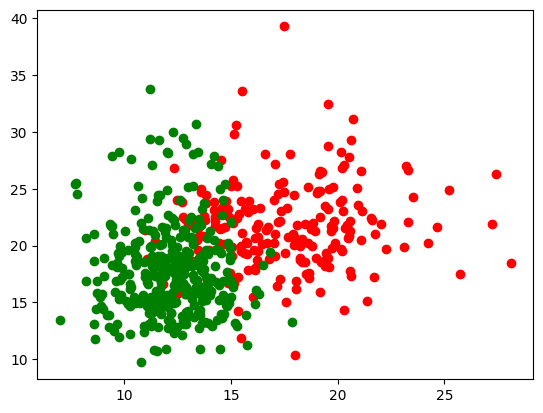

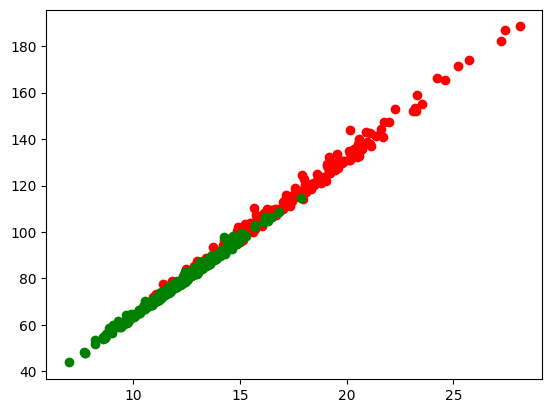

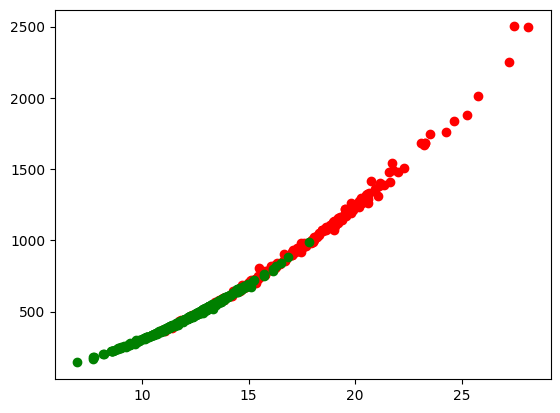

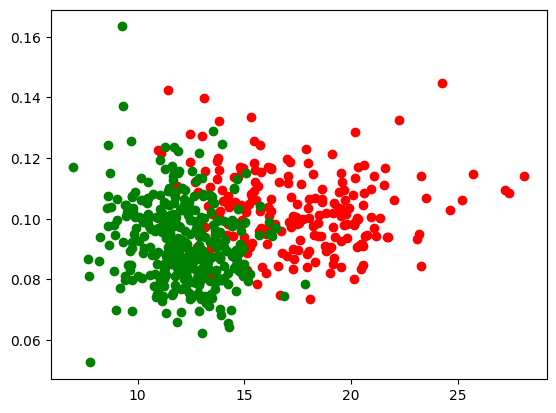

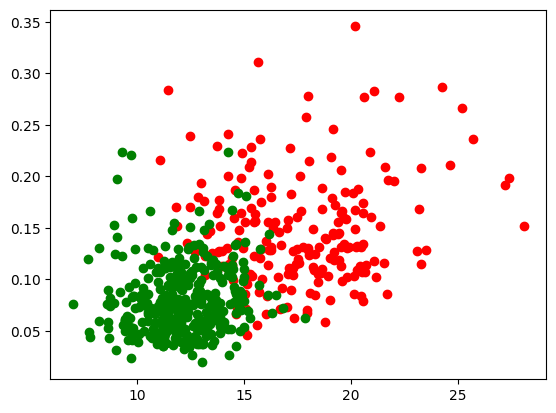

...

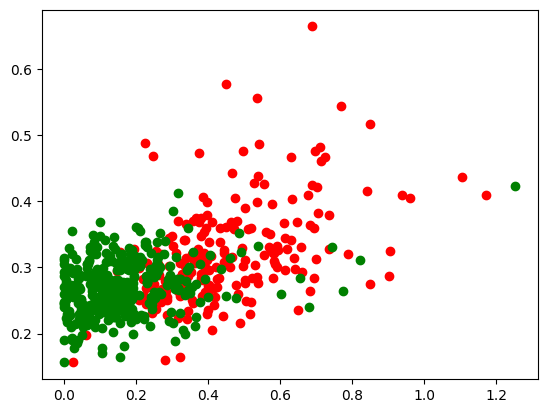

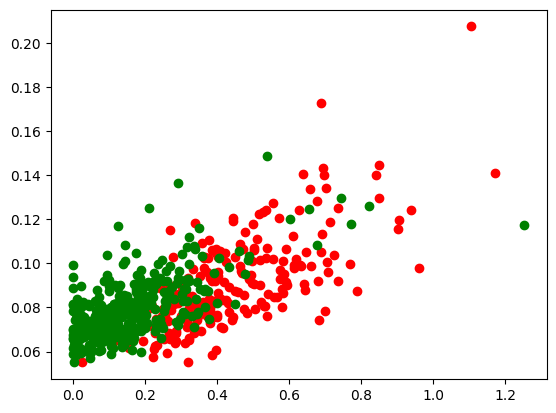

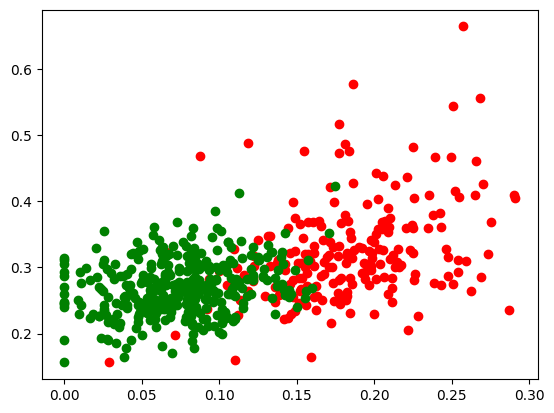

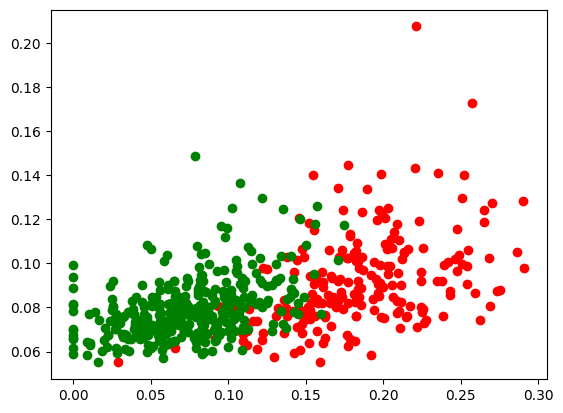

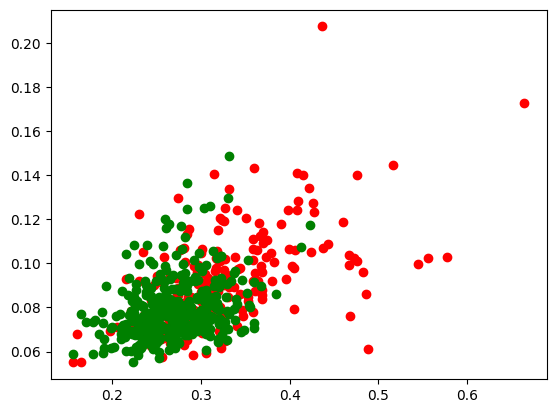

In [9]:
for f1,f2 in combinations(ds['feature_names'],2):
    plt.scatter(first_class[f1],first_class[f2],c='red')
    plt.scatter(second_class[f1],second_class[f2],c='green')
    plt.scatter(third_class[f1],third_class[f2],c='blue')
    plt.show()

In [10]:
X = df[[c for c in df.columns if c != 'target']]
y = df['target']

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.2)

In [12]:
X_train.shape[0], X_test.shape[0]

(455, 114)

In [13]:
kernel_options = ['linear', 'poly', 'rbf', 'sigmoid']

In [14]:
def clf_of_different_size(part):
    train_part = round(part*142)
    test_part = round(part*36)
    accs = []
    for k in kernel_options:
        clf = svm.SVC(kernel=k,degree=20).fit(X_train[:train_part],y_train[:train_part])
        y_predicted = clf.predict(X_test[:test_part])
        correct = np.array([y_predicted == y_test[:test_part]]).sum()
        total = y_test[:test_part].shape[0]
        acc = correct/total
        accs.append(acc)

#     for (kernel,acc) in list(zip(kernel_options,accs)):
#         print('{}: {:.3f}'.format(kernel,acc))
        
    return accs

In [15]:
accs_df = pd.DataFrame(kernel_options)
accs_df['20%'] = clf_of_different_size(.2)
accs_df['40%'] = clf_of_different_size(.4)
accs_df['60%'] = clf_of_different_size(.6)
accs_df['80%'] = clf_of_different_size(.8)
accs_df

/tmp/ipykernel_6786/3516130679.py:6: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  clf = svm.SVC(kernel=k,degree=20).fit(X_train[:train_part],y_train[:train_part])
/tmp/ipykernel_6786/3516130679.py:8: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  correct = np.array([y_predicted == y_test[:test_part]]).sum()
/tmp/ipykernel_6786/3516130679.py:9: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *labe

,0,20%,40%,60%,80%
0,linear,1.000000,0.928571,0.909091,0.896552
1,poly,0.857143,0.928571,0.909091,0.827586
2,rbf,1.000000,0.857143,0.909091,0.862069
3,sigmoid,0.428571,0.642857,0.363636,0.448276


In [16]:
def clf_different_poly_degrees(degrees,part):
    accs = []
    train_part = round(142*part)
    test_part = round(36*part)
    for d in degrees:
        clf = svm.SVC(kernel='poly',degree=d).fit(X_train[:train_part],y_train[:train_part])
        y_predicted = clf.predict(X_test[:test_part])
        correct = np.array([y_predicted == y_test[:test_part]]).sum()
        total = y_test[:test_part].shape[0]
        acc = correct/total
        accs.append(acc)
    return accs

In [ ]:
degrees = [5,10,15,20,25,30,35,40,45]
accs_degree_df = pd.DataFrame(degrees)
accs_degree_df['20%'] = clf_different_poly_degrees(degrees,.2)
accs_degree_df['40%'] = clf_different_poly_degrees(degrees,.4)
accs_degree_df['60%'] = clf_different_poly_degrees(degrees,.6)
accs_degree_df['80%'] = clf_different_poly_degrees(degrees,.8)
accs_degree_df['90%'] = clf_different_poly_degrees(degrees,.9)
# accs_degree_df['100%'] = clf_different_poly_degrees(degrees,1)
accs_degree_df

,0,20%,40%,60%,80%,90%
0,5,0.571429,0.714286,0.681818,0.655172,0.65625
1,10,0.714286,0.714286,0.681818,0.655172,0.65625
2,15,0.714286,0.714286,0.681818,0.655172,0.65625
3,20,0.714286,0.714286,0.681818,0.655172,0.65625
4,25,0.714286,0.714286,0.681818,0.655172,0.65625
5,30,0.714286,0.714286,0.681818,0.655172,0.65625
6,35,0.714286,0.714286,0.681818,0.655172,0.65625
7,40,0.714286,0.714286,0.681818,0.655172,0.65625
8,45,0.714286,0.714286,0.681818,0.655172,0.68750


In [17]:
non_linear_kernel_options = [o for o in kernel_options if o != 'linear']

In [18]:
def clf_different_gamma(g):
    accs = []
    part=.7
    train_part=round(142*part)
    test_part = round(36*part)
    for k in non_linear_kernel_options:
        clf = svm.SVC(kernel=k,gamma=g).fit(X_train[:train_part],y_train[:train_part])
        y_predicted = clf.predict(X_test[:test_part])
        correct = np.array([y_predicted == y_test[:test_part]]).sum()
        total = y_test[:test_part].shape[0]
        acc = correct/total
        accs.append(acc)
    return accs

In [19]:
df_gammas = pd.DataFrame(non_linear_kernel_options)
df_gammas['g=.01'] = clf_different_gamma(.01)
df_gammas['g=.001'] = clf_different_gamma(.001)
df_gammas['g=.0001'] = clf_different_gamma(.0001)
df_gammas['g=.00001'] = clf_different_gamma(.00001)
df_gammas['g=.000001'] = clf_different_gamma(.000001)
df_gammas['g=.0000001'] = clf_different_gamma(.0000001)
df_gammas['g=.00000001'] = clf_different_gamma(.00000001)
df_gammas

/tmp/ipykernel_6786/590244462.py:7: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  clf = svm.SVC(kernel=k,gamma=g).fit(X_train[:train_part],y_train[:train_part])
/tmp/ipykernel_6786/590244462.py:9: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  correct = np.array([y_predicted == y_test[:test_part]]).sum()
/tmp/ipykernel_6786/590244462.py:10: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-ba

,0,g=.01,g=.001,g=.0001,g=.00001,g=.000001,g=.0000001,g=.00000001
0,poly,0.92,0.92,0.92,0.96,0.92,0.80,0.60
1,rbf,0.60,0.96,1.00,0.92,0.88,0.88,0.72
2,sigmoid,0.60,0.60,0.60,0.60,0.52,0.88,0.60
